# [IAPR][iapr]: Project


**Group ID:** 32

**Author 1 (350508):** Ziyi ZHAO  
**Author 2 (321657):** Yujie HE  
**Author 3 (337088):** Xufeng GAO  

**Release date:** 02.02.2022


## Important notes

The assignments are designed to teach practical implementation of the topics presented during class as well as preparation for the final project, which is a practical project which ties together the topics of the course. 

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook !** rerun the notebook from scratch `Kernel` > `Restart & Run All`


[iapr]: https://github.com/LTS5/iapr

---
## 0. Introduction

An anonymous card player that we will name Bartick Pruel is willing to improve his poker skills. To do so, he asked our lab to design a tool that will automatically detect the hands of the players around the table. 

---

## 1. Data

To achieve your task, you will be given images that look like this (without the overlay)


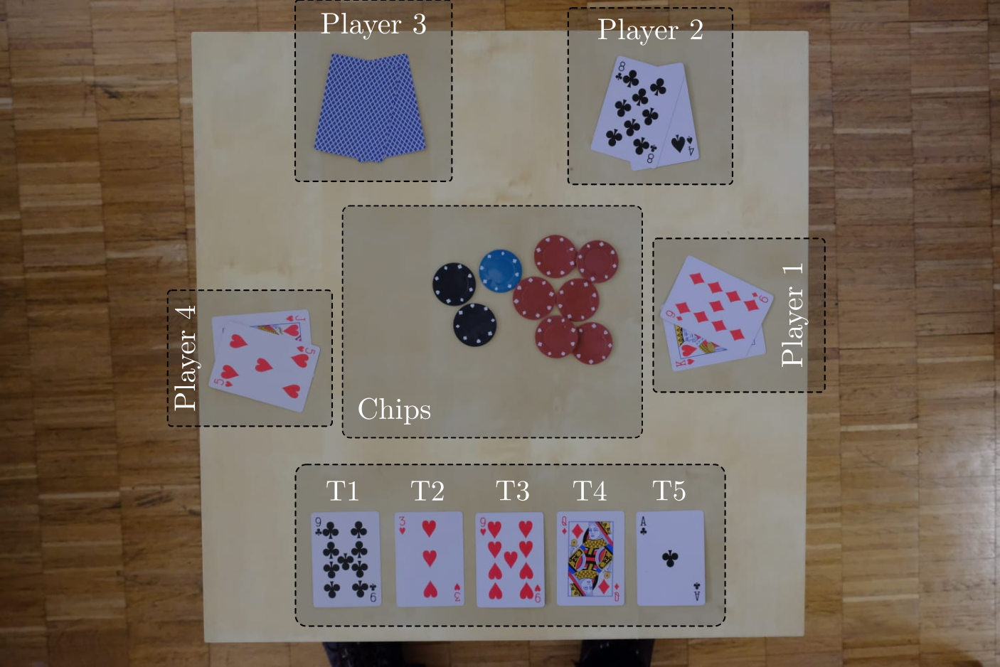

### 1.1. Table layout

The table is divided into 3 main parts:
* **Table cards (T1-T5)**: These cards are shared by every player. They are defined as the flop (T1-T3), the turn (T4) and the river (T5). The table cards are *always* visible.
* **Player cards (P11-P42)**: The cards played by each player (4 pairs). Each player *always* has 2 cards in hand. When a player is not playing, you can see the back of the cards (ex: player 3 here).
* **Chips**: The chips at the center of the table are named the pot.

### 1.2. Cards & Chips

The cards deck are composed of 52 cards split into 4 different colors: (D)imanond, (H)eart, (S)pade, (C)lub. Each color is composed of 13 different cards: 2, 3, 4, 5, 6, 7, 8, 9, 10, (J)ack, (Q)ueen, (K)ing and (A)ce.

Th chips can be of 5 different colors: (r)ed, (g)reen, (b)lue, blac(k) or (w)hite.


### 1.3 Structure

You can download the data for the project here: [download data](https://drive.google.com/file/d/1d7rOe88kEK1CEaLvYgNZkxrtKImLVC9X/view)

```
data 
│
└─── image_setup
│    │    back_cards.jpg      # Back of the cards (either blue or red)
│    │    chips.jpg           # Set of chips used (red, green, blue, black, white)
│    │    kings.jpg           # Kings from the 4 colors (diamond, heart, spade, club)
│    │    spades_suits.jpg    # All cards of spades (2 - 10, Jack, Queen, King, Ace)
│    │    table.jpg           # Empty table
│    └─── ultimate_test.jpg   # If it works on that image, you would probably end up with a good score
│
└─── train
│    │    train_00.jpg        # Train image 00
│    │    ...
│    │    train_27.jpg        # Train image 27
│    └─── train_labels.csv    # Ground truth of the train set
│
└─── test
     │    test_00.jpg         # Test image 00 (day of the exam only)
     │    ...
     └─── test_xx             # Test image xx (day of the exam only)
```


---

## 2. Tasks


Your task is to predict the following parameters for a set of images.

* **T1** (str): String code of the first card of the flop (far left) 
* **T2** (str): String code of the second card of the flop
* **T3** (str): String code of the third card of the flop
* **T4** (str): String code of the turn
* **T5** (str): String code of the river


* **P11** (str or int): String code of player 1 card 1. Should be 0 if player 1 is not Playing.
* **P12** (str or int): String code of player 1 card 2. Should be 0 if player 1 is not Playing.
* **P21** (str or int): String code of player 2 card 1. Should be 0 if player 2 is not Playing.
* **P22** (str or int): String code of player 2 card 2. Should be 0 if player 2 is not Playing.
* **P31** (str or int): String code of player 3 card 1. Should be 0 if player 3 is not Playing.
* **P32** (str or int): String code of player 3 card 2. Should be 0 if player 3 is not Playing.
* **P41** (str or int): String code of player 4 card 1. Should be 0 if player 4 is not Playing.
* **P42** (str or int): String code of player 4 card 2. Should be 0 if player 5 is not Playing.


* **CR** (int): Number of (r)ed chips in the pot
* **CG** (int): Number of (g)reen chips in the pot
* **CB** (int): Number of (b)lue chips in the pot
* **CK** (int): Number of blac(k) chips in the pot
* **CW** (int): Number of (w)hite chips in the pot


The output is saved using the function **save_results** as presented below.

---





## 3. Evaluation

**Before the exam**
   - Create a zipped folder named **groupid_xx.zip** that you upload on moodle (xx being your group number).
   - Include a **runnable** code (Jupyter Notebook and external files) and your presentation in the zip folder.
   
**The day of the exam**
   - You will be given a **new folder** with few images, but **no ground truth** (csv file).
   - We will ask you to run your pipeline in **real time** and to send us your prediction of the task you obtain with the provided function **save_results**. 
   - On our side, we will compute the performance of your classification algorithm. 
   - To evaluate your method, we will use the **evaluate_game** function presented below. To understand how the provided functions work, please read the documentation of the functions in **utils.py**.
   - **Please make sure your function returns the proper data format to avoid points penalty on the day of the exam**. 
---

## 4. Your code


### Image cutting / Area Labelling

#### Introduction

1. 图片切割坐标原点和参考系

  若采取原图坐标系和参考系，即左上角像素（0,0）处为坐标原点，图片长度和宽度为坐标系，**纸牌相对桌子的位置基本固定**，但由于桌子位置相对坐标原点的差异导致切割结果出现重大不确定性。**因此**使用桌子左上角顶点为坐标原点，桌子的长度为坐标系，此处认为桌子为标准的正方形。
 

2. 从原图中提取桌子区域

  坐标系：对图片进行预处理，包括erosion和灰度化，然后使用opencv进行轮廓检测。由于某些图像具有过曝等问题，因此个别检测结果不很理想。之后采用四边形拟合方法，获得桌子左上角顶点坐标。经过考察，所有正方形的左上角顶点均可完美拟合桌子顶点。

  参考系：由于拍摄时的角度差异带来的细微影响，桌子的长度有所不同，因此理论上需要建立不同的参考系，以确定具体的切割区域大小，但这部分任务较为复杂，考虑切割准确性并不精密，因此暂时默认所有图片中桌子长度所占像素个数均相等。

3. Summary

  **纸牌和chips相对桌子固定，但桌子位置相对于图片坐标原点不固定，因此需要首先在图片中提取桌面区域。**


**Useful notes**

1. OpenCV read image in BGR channel, as a narray
2. PIL read image as an object: PIL.JpegImagePlugin.JpegImageFile which can be tranfomed into narray using np.array(object)



- if code in Colab

In [1]:
# from google.colab import drive
# drive.mount('/content/drive')
# sys.path.append('/content/drive/MyDrive/iapr/project/')

In [2]:
# std
from typing import Union
from glob import glob
import warnings
warnings.filterwarnings("ignore")
import os,sys

# imported
import cv2 as cv
import matplotlib.pyplot as plt
import PIL.Image
import numpy as np
import pandas as pd
from termcolor import colored
from treys import Card

# custom
from utils import eval_listof_games , debug_listof_games, save_results , load_results

In [3]:
project_dir_path = os.path.dirname(os.path.realpath("__file__"))
# '/home/he/projects/iapr/project'

In [4]:
# Global variables and functions

data_path = "data/train"
train_size = np.loadtxt(os.path.join(data_path, "train_size.txt")).astype(int)
file = os.path.join(data_path, f"train_{str(0).zfill(2)}.jpg")
im_origin = PIL.Image.open(file)

In [5]:
# Global functions
def plotMultipleImages(nrows, ncols, images, titles, cmap, fig_title):
    fig = plt.figure(figsize=(14,8))
    plt.axis('off')
    plt.title(fig_title)
    fig.subplots_adjust(hspace=0.4, wspace=0.3)
    for i in range(len(titles)):
        ax = fig.add_subplot(nrows, ncols, i+1)
        # ax.axis('off')
        ax.set_title(titles[i])
        ax.set_xlabel(titles[i])
        if cmap[i]=='rgb':
            ax.imshow(images[i])
        else:
            ax.imshow(images[i], cmap=cmap[i])
    plt.show()

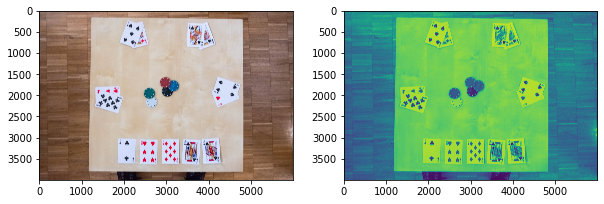

In [6]:
# Visualization

plt.figure(figsize=(10,10))
plt.subplot(1,2,1) 
plt.imshow(im_origin)
plt.subplot(1,2,2)
imgGrey = im_origin.convert('L')
plt.imshow(imgGrey)
plt.show()

#### 1 Extracting the desktop and creating a uniform coordinate system

In [7]:
# Pre-processing
def preprocessing(im_origin = '', thresh=100):
    h, w, ch = np.array(im_origin).shape
    obj_img = np.ones((h, w, ch), dtype=np.uint8)
    obj_img_255 = obj_img*255

    img_inverse = obj_img_255-np.array(im_origin)
    gaussian_im = cv.GaussianBlur(np.array(img_inverse), (5,5), 0)
    img_bgr = cv.cvtColor(gaussian_im, cv.COLOR_RGB2BGR)
    im_gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)
    print("Using threshold:", thresh)
    ret, binary = cv.threshold(im_gray, thresh, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)
    # ret, binary = cv.threshold(im_gray, thresh, 255, cv.THRESH_BINARY_INV | cv.THRESH_OTSU)
    kernel = cv.getStructuringElement(cv.MORPH_ERODE, (6,6))
    im_morph = cv.morphologyEx(binary, cv.MORPH_ERODE, kernel, iterations=10)
    return obj_img, im_morph, binary

# Extraction of the maximum contour, i.e. the Table
def tableCutting(obj_img, im_morph): 
  
    # Detection of maximum contours
    contours, hierarchy = cv.findContours(im_morph, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    area = []
    for k in range(len(contours)):
        area.append(cv.contourArea(contours[k]))
    max_idx = np.argmax(np.array(area))

    # Visualization
    # cv.drawContours(obj_img, contours, max_idx, [255,255,255], cv.FILLED)
    # plt.figure(figsize=(12,12))
    # plt.subplot(1,2,1)
    # plt.imshow(obj_img)
    # plt.title('Longest Contour')

    # External polygon fitting, table top left coordinate extraction
    rect = cv.minAreaRect(contours[max_idx]) # Get the (centre(x,y), (width,height), rotation angle) of the smallest outer rectangle
    box = cv.boxPoints(rect) # Get the coordinates of the 4 vertices of the smallest outer rectangle(ref: cv2.boxPoints(rect) for OpenCV 3.x)
    # converting bounding box floating point values to int in OpenCV problems.
    # box = np.int0(box)
    # o_index = np.argmin(np.sum(box, axis=1), axis=0)
    table_corners = np.int0(box)

    # Visularization
    # cv.circle(obj_img, tuple(box[o_index]), 8, (0, 255, 255), 150)
    # cv.drawContours(obj_img, [box], 0, (255, 0, 0), 20)
    # plt.subplot(122)
    # plt.imshow(obj_img)
    # plt.title('minAreaRect')
    # plt.show()
    # return box[o_index]
    return rect, table_corners

# Extraction of the maximum contour, i.e. the Table
def tableCutting2(im_morph):
    
    threshold1 = 255
    threshold2 = 50
    gaussian = cv.GaussianBlur(dst, (9, 9), 0)
    edges = cv.Canny(gaussian, threshold1, threshold2)
    contours, hierarchy = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    # contours = sorted(contours, key=cv.contourArea,reverse=True)[:5]
    
    # Detection of maximum contours
    # contours, hierarchy = cv.findContours(im_morph, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    area = []
    for k in range(len(contours)):
        area.append(cv.contourArea(contours[k]))
    max_idx = np.argmax(np.array(area))

    # External polygon fitting, table top left coordinate extraction
    rect = cv.minAreaRect(contours[max_idx]) # Get the (centre(x,y), (width,height), rotation angle) of the smallest outer rectangle
    box = cv.boxPoints(rect) # Get the coordinates of the 4 vertices of the smallest outer rectangle(ref: cv2.boxPoints(rect) for OpenCV 3.x)

    table_corners = np.int0(box)

    return rect, table_corners

def getTableOrigin(table_corners: np.ndarray) -> np.ndarray:
    origin_index = np.argmin(np.sum(table_corners, axis=1), axis=0)
    table_origin = table_corners[origin_index]
    return table_origin

#### 2 Extraction of different label areas in the table

In [8]:
# Crop, currently only T label.
def crop(o, im_origin, viz=True, fig_title=None):
    # train_size = np.loadtxt(os.path.join(data_path, "train_size.txt")).astype(int)
    # w1,h1,w2,h2，
    box_p1 = (o[0]+2600, o[1]+1000, o[0]+3760, o[1]+2400)
    box_p2 = (o[0]+1750, o[1]-50, o[0]+3216, o[1]+880)
    box_p3 = (o[0]+216, o[1]-50, o[0]+1700, o[1]+880)
    box_p4 = (o[0]-50, o[1]+1200, o[0]+1000, o[1]+2265)

    box_T = (o[0], o[1]+2601, o[0]+3765, o[1]+3765)
    box_C = (o[0]+660, o[1]+865, o[0]+2600, o[1]+2465)
    boxes = [box_p1, box_p2, box_p3, box_p4, box_T, box_C]
    im_parts = []
    for box in boxes:
        im = im_origin.crop(box)
        im_parts.append(im)
    # train_ims_crop = []
    # train_ims_crop.append(ims)
    im_names = ['P1', 'p2', 'p3', 'p4', 'T1-T5', 'CR-CW']
    if viz:
        plotMultipleImages(1, 6, im_parts, im_names, cmap=['rgb']*6, fig_title=fig_title)
    return im_parts

In [9]:
obj_img, im_morph, _ = preprocessing(im_origin)

Using threshold: 100


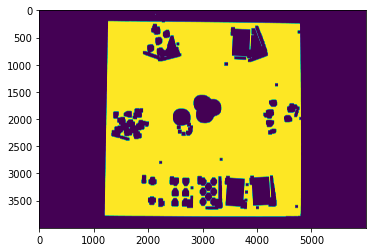

In [10]:
plt.imshow(im_morph)

In [11]:
rect, table_corners = tableCutting(obj_img, im_morph)
print(table_corners)
table_origin = getTableOrigin(table_corners)
print(table_origin)

[[4801 3809]
 [1205 3773]
 [1241  201]
 [4837  237]]
[1241  201]


In [12]:
def crop_rect(img, rect):
    # get the parameter of the small rectangle
    center = rect[0]
    size = rect[1]
    angle = rect[2]
    center, size = tuple(map(int, center)), tuple(map(int, size))

    # get row and col num in img
    height, width = img.shape[0], img.shape[1]
    print("width: {}, height: {}".format(width, height))

    M = cv.getRotationMatrix2D(center, angle, 1)
    img_rot = cv.warpAffine(img, M, (width, height))

    img_crop = cv.getRectSubPix(img_rot, size, center)
    
    print("crop size", img_crop.shape)
    print("crop image aspect ratio", img_crop.shape[0]/img_crop.shape[1])

    return img_crop, img_rot

((3021.49267578125, 2005.6497802734375), (3572.274658203125, 3596.843994140625), -89.42074584960938)
width: 6000, height: 4000
crop size (3596, 3572, 3)
crop image aspect ratio 1.0067189249720045


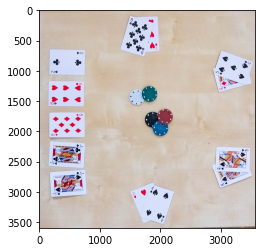

In [13]:
img = np.asarray(im_origin)
# plt.imshow(img)
print(rect)
img_crop, img_rot = crop_rect(img, rect)
plt.imshow(img_crop)

### challenges: 11/13/22

#### original

In [14]:
def preprocessing_scale(im_origin = '', thresh=100):
    h, w, ch = np.array(im_origin).shape
    obj_img = np.ones((h, w, ch), dtype=np.uint8)
    obj_img_255 = obj_img*255
    img_inverse = obj_img_255-np.array(im_origin)
    gaussian_im = cv.GaussianBlur(np.array(img_inverse), (5,5), 0)
    img_bgr = cv.cvtColor(gaussian_im, cv.COLOR_RGB2BGR)
    im_gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)
    print("Using threshold:", thresh)
    ret, binary = cv.threshold(im_gray, thresh, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)
    # ret, binary = cv.threshold(im_gray, thresh, 255, cv.THRESH_BINARY_INV | cv.THRESH_OTSU)
    kernel = cv.getStructuringElement(cv.MORPH_ERODE, (3, 3))
    im_morph = cv.morphologyEx(binary, cv.MORPH_ERODE, kernel, iterations=10)
#     kernel = cv.getStructuringElement(cv.MORPH_DILATE, (3, 3))
#     im_morph = cv.morphologyEx(im_morph, cv.MORPH_DILATE, kernel, iterations=10)
    return obj_img, im_morph, binary

In [25]:
def mask_from_contours(ref_img, contours):
    mask = np.zeros(ref_img.shape, np.uint8)
    mask = cv2.drawContours(mask, contours, -1, (255,255,255), -1)
    return cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)

def dilate_mask(mask, kernel_size=10):
    kernel  = np.ones((kernel_size,kernel_size), np.uint8)
    dilated = cv2.dilate(mask, kernel, iterations=1)
    return dilated

def find_contours(img, to_gray=None):
    kernel   = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11,11))
    morphed  = cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel)
    contours = cv2.findContours(morphed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    return contours

def addRectOffset(rect, offset=10):
    rect_list = list(rect)
    rect_list[1] = [val+offset for val in rect_list[1]]
    rect = tuple(rect_list)
    return rect

def scaleRect(rect, scale=4.0):
    rect_list = list(rect)
    rect_list[0] = [val*scale for val in rect_list[0]]
    rect_list[1] = [val*scale for val in rect_list[1]]
    rect = tuple(rect_list)
    return rect

def transRect(rect, trans=(800, 50)):
    rect_list = list(rect)
    rect_list[0][0] += trans[0]
    rect_list[0][1] += trans[1]
    rect = tuple(rect_list)
    return rect

In [26]:
# https://stackoverflow.com/a/41075028
# https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html
def addContrast(img):

    hist,bins = np.histogram(img.flatten(),256,[0,256])
    cdf = hist.cumsum()
    # cdf_normalized = cdf * float(hist.max()) / cdf.max()
    cdf_m = np.ma.masked_equal(cdf,0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    cdf = np.ma.filled(cdf_m,0).astype('uint8')
    img2 = cdf[img]
    
    return img2

Using threshold: 100
width: 1100, height: 975
crop size (869, 876, 3)
crop image aspect ratio 0.9920091324200914
width: 6000, height: 4000
crop size (3476, 3504, 3)
crop image aspect ratio 0.9920091324200914
Using threshold: 100
width: 1100, height: 975
crop size (862, 874, 3)
crop image aspect ratio 0.9862700228832952
width: 6000, height: 4000
crop size (3449, 3498, 3)
crop image aspect ratio 0.9859919954259577
Using threshold: 100
width: 1100, height: 975
crop size (870, 869, 3)
crop image aspect ratio 1.001150747986191
width: 6000, height: 4000
crop size (3482, 3477, 3)
crop image aspect ratio 1.001438021282715


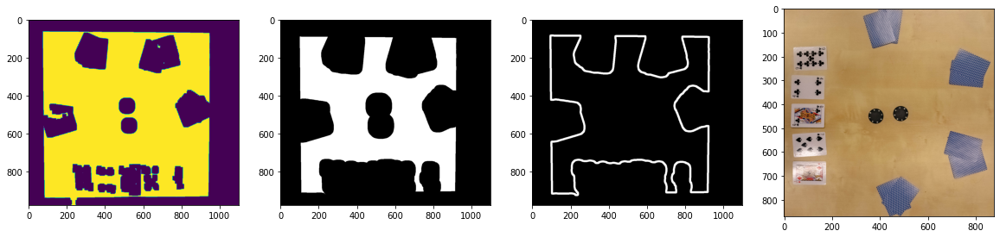

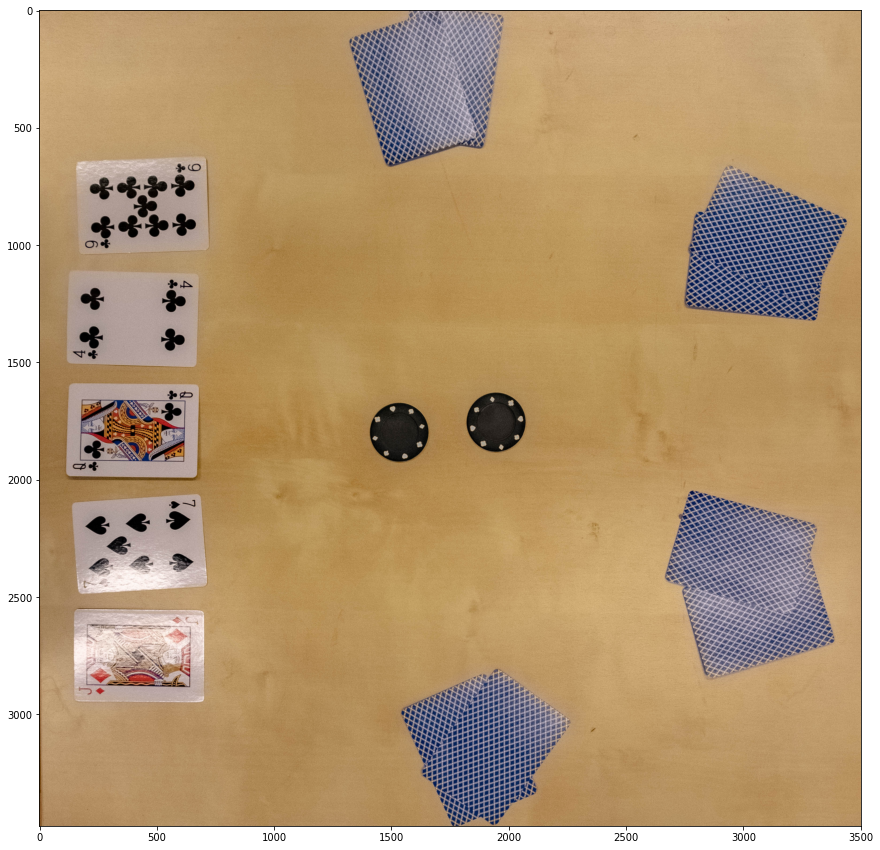

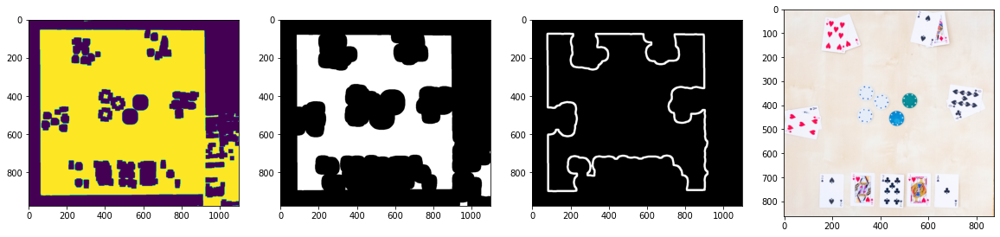

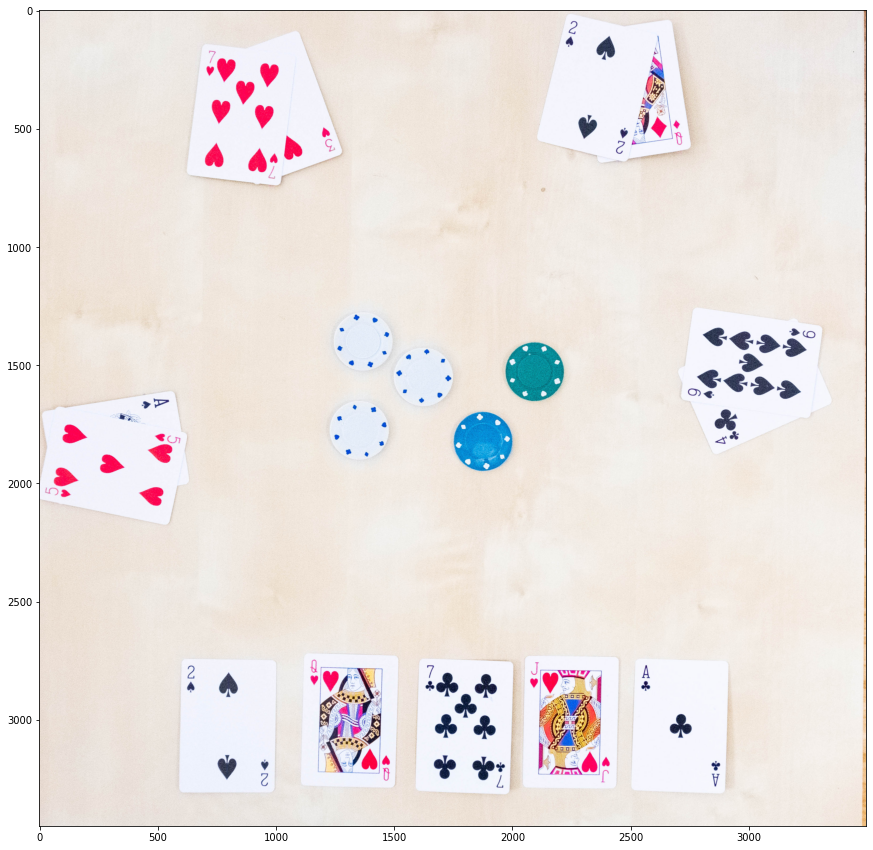

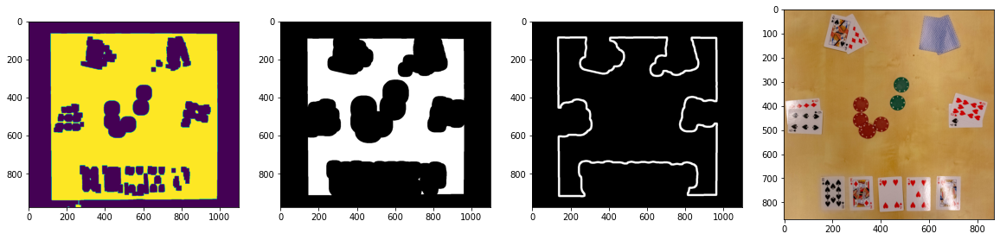

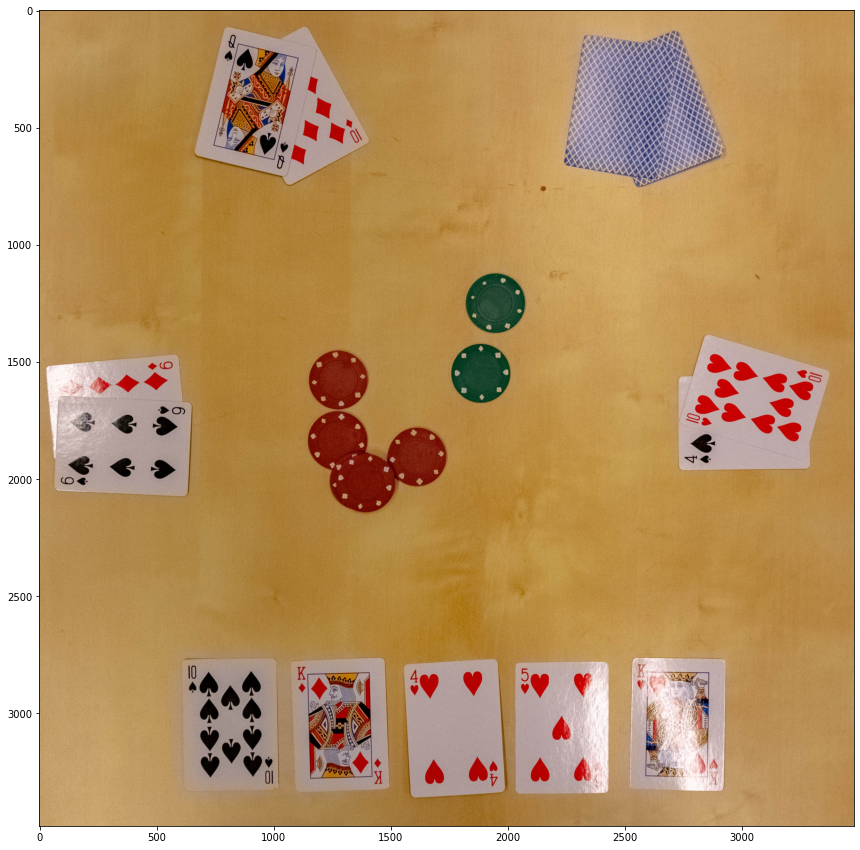

In [28]:
test_files = [
    'data/train/train_11.jpg',
    'data/train/train_13.jpg',
    'data/train/train_22.jpg',
]

resize = True
for file in test_files:
    
    # print('Image number: {}'.format(i))
    # file = os.path.join(data_path, f"train_{str(i).zfill(2)}.jpg")
    im_origin_ = PIL.Image.open(file)
    w, h = im_origin_.size
    crop_sz = (800, 50) # 800, 50 | 400, 20
    im_origin_crop = im_origin_.crop((crop_sz[0], crop_sz[1], w-crop_sz[0], h-crop_sz[1]))
    # im_origin_ = im_origin_.crop((800, 50, w-800, h-50))
    im_origin = np.asarray(im_origin_crop)
    
    if resize:
        scale_precent = 25
        width = int(im_origin.shape[1] * scale_precent/100)
        height = int(im_origin.shape[0] * scale_precent/100)
        dim = (width, height)
        im_origin = cv.resize(im_origin, dim, interpolation=cv.INTER_AREA)
    # print(im_origin.shape)
    
    obj_img, im_morph, thresh_image = preprocessing_scale(im_origin, thresh=100)
    # rect, table_corners = tableCutting(obj_img, im_morph)
    # rect2, table_corners2 = tableCutting2(im_morph)
    # plt.imshow(im_morph)
    
    # sure background area
    kernel = np.ones((3,3),np.uint8)
    # Finding sure foreground area
    dist_transform = cv.distanceTransform(im_morph, cv.DIST_L2,5)
    ret, sure_fg = cv.threshold(dist_transform,0.2*dist_transform.max(),255,0)
    # Finding unknown region
    sure_fg = np.uint8(sure_fg)
    
    threshold1 = 175
    threshold2 = 0
    edges = cv.Canny(sure_fg, threshold1, threshold2)
    edges = cv.dilate(edges,kernel,iterations = 5)
    
    contours, hierarchy = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    # contour = sorted(contours, key=cv.contourArea,reverse=True)[-1]
    contour = sorted(contours, key=lambda c: cv.arcLength(c, False), reverse=True)[0]
    # rect = cv.minAreaRect(contours[max_idx])
    contour_im = np.zeros((height, width, 3), dtype=np.uint8)
    # contour = cv.convexHull(contour)
    cv.drawContours(contour_im, [contour], -1, (255, 255, 255), 10)
    
    # add offset to contour: https://stackoverflow.com/a/55951405
    # orig_mask = mask_from_contours(contour_im, [contour])
    # dilated_mask = dilate_mask(orig_mask, 100)
    # dilated_contours = find_contours(dilated_mask)
    # contour = sorted(contours, key=lambda c: cv.arcLength(c, False), reverse=True)[0]
    rect = cv.minAreaRect(contour)
    rect = addRectOffset(rect, offset=40)
    
    # crop table
    img_np = np.asarray(im_origin)
    img_crop, img_rot = crop_rect(img_np, rect)
    
    img_np_origin = np.asarray(im_origin_)
    rect_origin = scaleRect(rect, scale=4.0)
    rect_origin = transRect(rect_origin, trans=(800, 50))
    img_crop_origin, img_rot_origin = crop_rect(img_np_origin, rect_origin)
    
    # img_crop = addContrast(img_crop)
    
    # img_crop2, img_rot2 = crop_rect(img_np, rect2)
    # plt.imshow(img_crop)
    fig, ax = plt.subplots(1, 4, figsize=(20, 8))
    ax[0].imshow(im_morph)
    # ax[2].imshow(thresh_image, cmap='gray')
    ax[1].imshow(sure_fg, cmap='gray')
    ax[2].imshow(contour_im, cmap='gray') # edges
    ax[3].imshow(img_crop)
    fig2, ax2 = plt.subplots(figsize=(15, 15))
    ax2.imshow(img_crop_origin)

In [58]:
# plt.figure(figsize=(25,25))
# plt.imshow(addContrast(thresh_image), cmap='gray')

- simple take longest contour

Text(0.5, 1.0, 'Longest Contour')

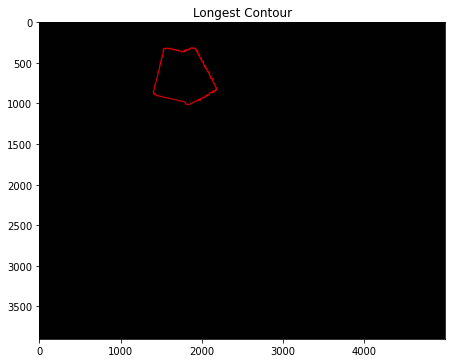

In [115]:
contours, hierarchy = cv.findContours(im_morph, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

area = []
for k in range(len(contours)):
    area.append(cv.contourArea(contours[k]))
max_idx = np.argmax(np.array(area))
cv.drawContours(obj_img, contours, max_idx, [255,0,0], 10)
plt.figure(figsize=(16,16))
plt.subplot(1,2,1)
plt.imshow(obj_img)
plt.title('Longest Contour')

In [ ]:
def tableCutting_new(obj_img, im_morph): 
  
    # Detection of maximum contours
    contours, hierarchy = cv.findContours(im_morph, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

    # Visualization
    # cv.drawContours(obj_img, contours, max_idx, [255,255,255], cv.FILLED)
    # plt.figure(figsize=(12,12))
    # plt.subplot(1,2,1)
    # plt.imshow(obj_img)
    # plt.title('Longest Contour')

    # External polygon fitting, table top left coordinate extraction
    rect = cv.minAreaRect(contours[max_idx]) # Get the (centre(x,y), (width,height), rotation angle) of the smallest outer rectangle
    box = cv.boxPoints(rect) # Get the coordinates of the 4 vertices of the smallest outer rectangle(ref: cv2.boxPoints(rect) for OpenCV 3.x)
    # converting bounding box floating point values to int in OpenCV problems.
    # box = np.int0(box)
    # o_index = np.argmin(np.sum(box, axis=1), axis=0)
    table_corners = np.int0(box)

    # Visularization
    # cv.circle(obj_img, tuple(box[o_index]), 8, (0, 255, 255), 150)
    # cv.drawContours(obj_img, [box], 0, (255, 0, 0), 20)
    # plt.subplot(122)
    # plt.imshow(obj_img)
    # plt.title('minAreaRect')
    # plt.show()
    # return box[o_index]
    return rect, table_corners

width: 4400, height: 3900
crop size (1206, 6, 3)
crop image aspect ratio 201.0


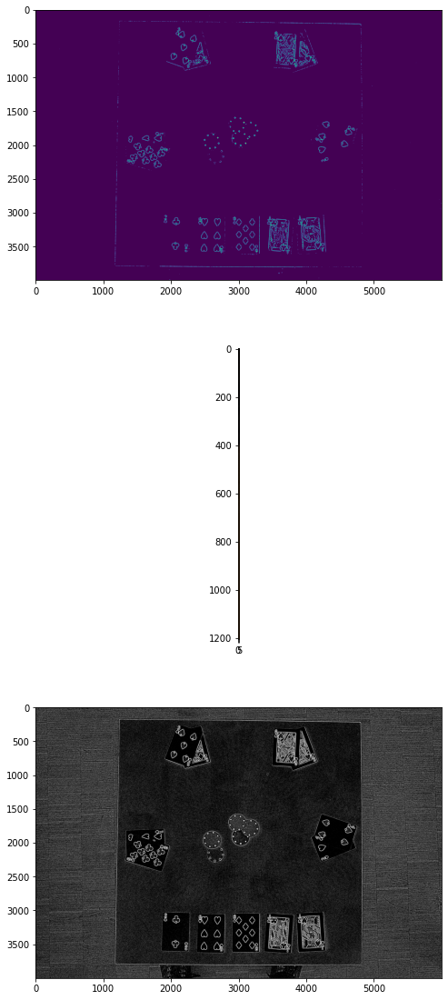

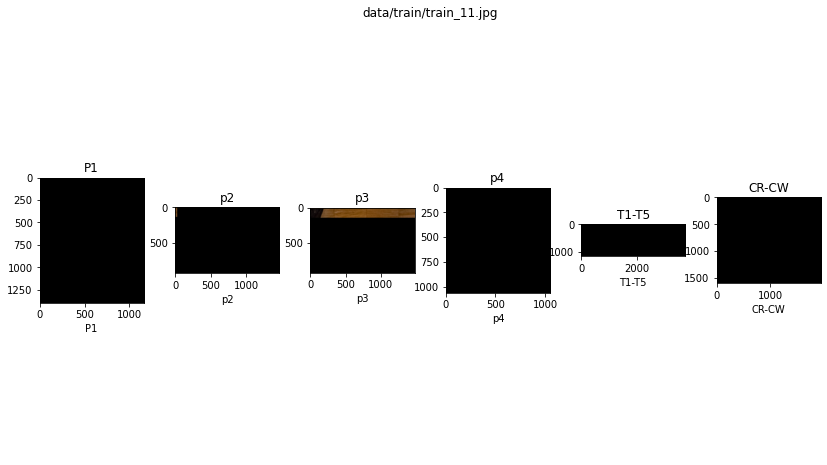

width: 4400, height: 3900
crop size (1206, 6, 3)
crop image aspect ratio 201.0


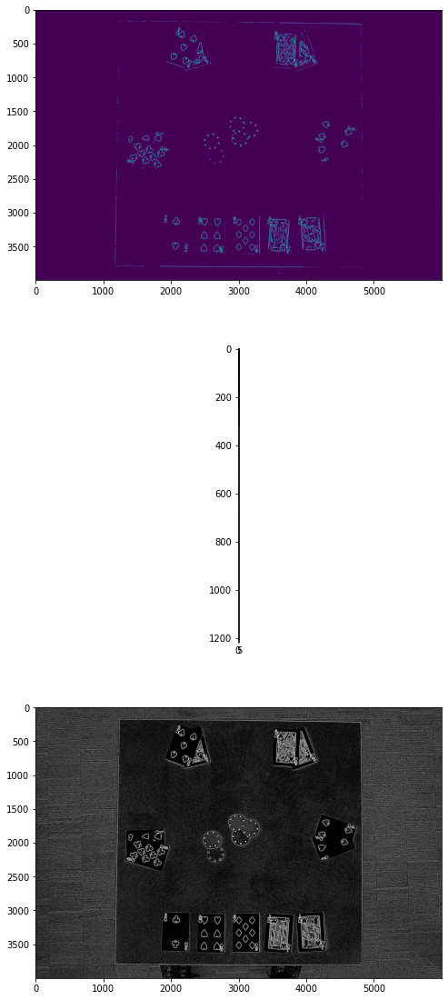

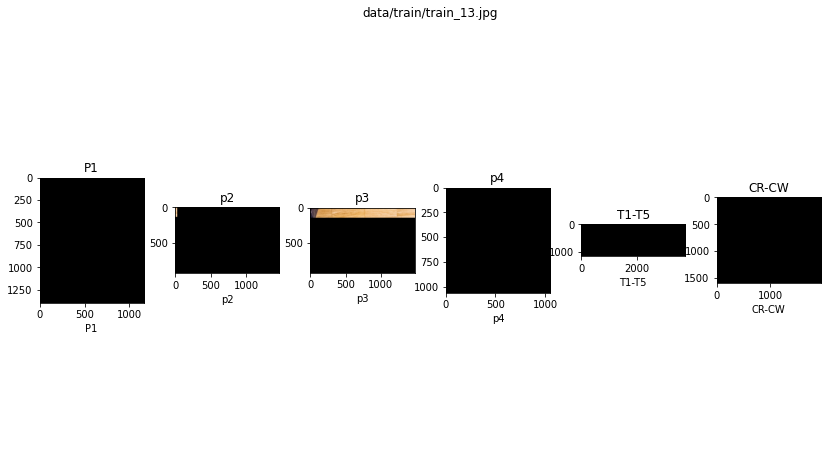

width: 4400, height: 3900
crop size (1206, 6, 3)
crop image aspect ratio 201.0


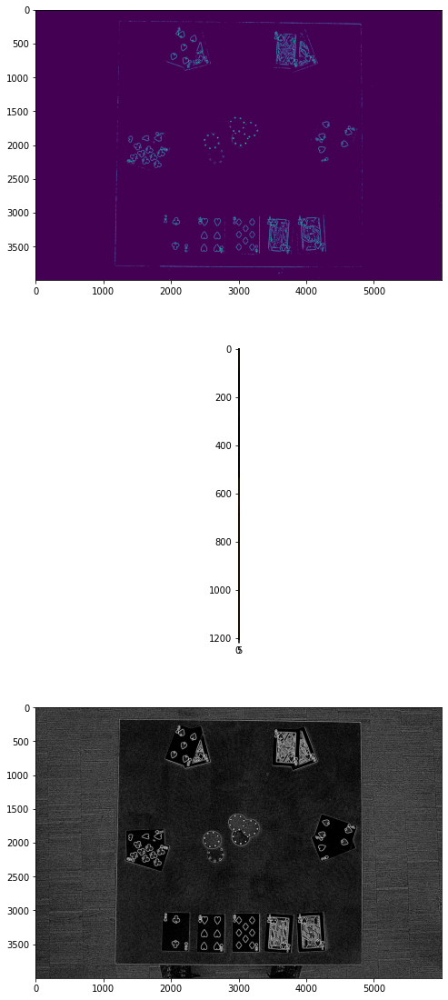

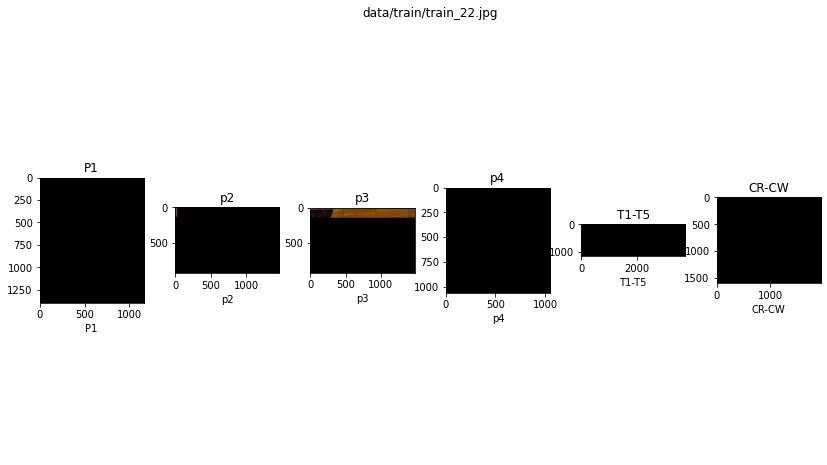

In [25]:
test_files = [
    'data/train/train_11.jpg',
    'data/train/train_13.jpg',
    'data/train/train_22.jpg',
]
for file in test_files:
    # print('Image number: {}'.format(i))
    # file = os.path.join(data_path, f"train_{str(i).zfill(2)}.jpg")
    im_origin = PIL.Image.open(file)
    w, h = im_origin.size
    im_origin = im_origin.crop((800, 50, w-800, h-50))
    obj_img, im_morph, thresh_image = preprocessing_adaptive(im_origin, thresh=100)
    
    rect, table_corners = tableCutting(obj_img, im_morph)
    # rect2, table_corners2 = tableCutting2(im_morph)
    # plt.imshow(im_morph)
    
    # crop table
    img_np = np.asarray(im_origin)
    img_crop, img_rot = crop_rect(img_np, rect)
    # img_crop2, img_rot2 = crop_rect(img_np, rect2)
    # plt.imshow(img_crop)
    fig, ax = plt.subplots(3, 1, figsize=(8, 20))
    ax[0].imshow(im_morph)
    ax[1].imshow(img_crop)
    ax[2].imshow(thresh_image, cmap='gray')
    
    # crop parts
    table_origin = getTableOrigin(table_corners)
    crop(table_origin, im_origin, fig_title=file)

### cropping parts test

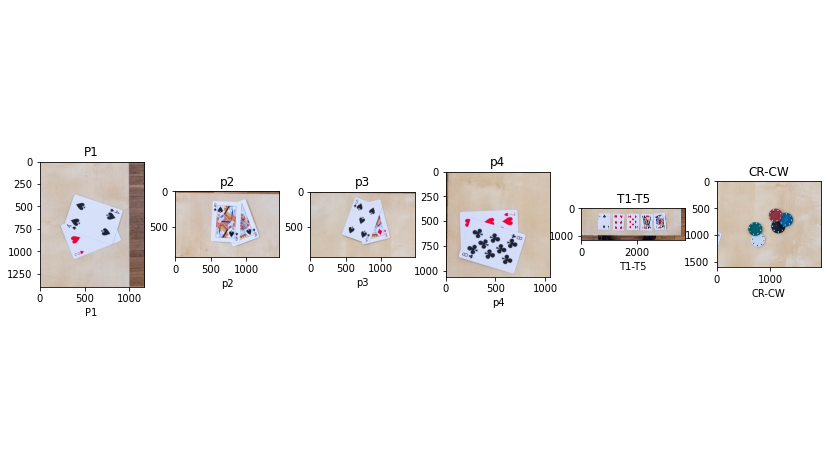

In [16]:
im_parts = crop(table_origin, im_origin)

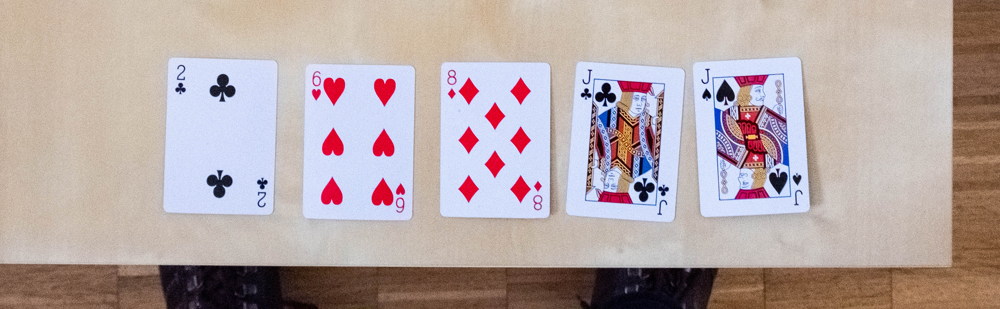

In [17]:
# print(type(im_parts[2]))
im_parts[4]

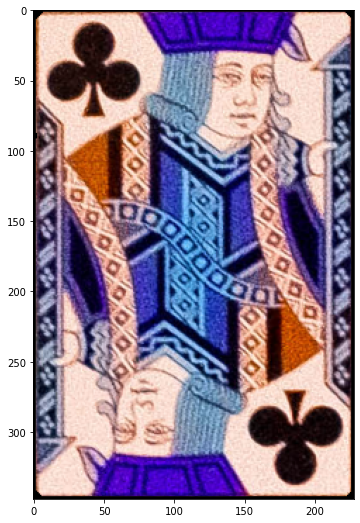

In [21]:
from extraction_utils import extract_card, display_img

debug=False
# img=cv2.imread("test/scene.png")
# display_img(img)
img = np.asarray(im_parts[4])
valid,card=extract_card(img,"test/extracted_card.png", debug=debug)
if valid:
    display_img(card)
if debug:
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [22]:
valid

True

#### 3 Cutting of all images


In [20]:
for i in range(train_size):
    print('Image number: {}'.format(i))
    file = os.path.join(data_path, f"train_{str(i).zfill(2)}.jpg")
    im_origin = PIL.Image.open(file)
    obj_img, im_morph = preprocessing(im_origin)
    rect, table_corners = tableCutting(obj_img, im_morph)
    
    # crop table
    img_np = np.asarray(im_origin)
    img_crop, img_rot = crop_rect(img_np, rect)
    plt.imshow(img_crop)
    
    # crop parts
    table_origin = getTableOrigin(table_corners)
    crop(table_origin, im_origin, fig_title=file)

Image number: 0
Using threshold: 100


ValueError: too many values to unpack (expected 2)

### Original Code

In [ ]:
def process_image(image) -> dict:
    """
    Process image and return information. To return the value of the cards we use 
    the following format: {number}{color}. Where 
        - color is either (D)imanond, (H)eart, (S)pade, (C)lub
        - number is either 2-10, (J)ack, (Q)ueen, (K)ing. A(ce).
            
    Parameters
    ----------
    image:
        Input image to process

    Returns
    -------
    results:
        - T1 (str): String code of the first card of the flop (far left) 
        - T2 (str): String code of the second card of the flop
        - T3 (str): String code of the third card of the flop
        - T4 (str): String code of the turn
        - T5 (str): String code of the river
        - P11 (str or int): String code of player 1 card 1. Should be 0 if player 1 is not Playing.
        - P12 (str or int): String code of player 1 card 2. Should be 0 if player 1 is not Playing.
        - P21 (str or int): String code of player 2 card 1. Should be 0 if player 2 is not Playing.
        - P22 (str or int): String code of player 2 card 2. Should be 0 if player 2 is not Playing.
        - P31 (str or int): String code of player 3 card 1. Should be 0 if player 3 is not Playing.
        - P32 (str or int): String code of player 3 card 2. Should be 0 if player 3 is not Playing.
        - P41 (str or int): String code of player 4 card 1. Should be 0 if player 4 is not Playing.
        - P42 (str or int): String code of player 4 card 2. Should be 0 if player 4 is not Playing.
        - CR (int): Number of (r)ed chips in the pot
        - CG (int): Number of (g)reen chips in the pot
        - CB (int): Number of (b)lue chips in the pot
        - CK (int): Number of blac(k) chips in the pot
        - CW (int): Number of (w)hite chips in the pot
        
    Examples
    --------
    - QH: Queen of hearths
    - 10S: 10 of spades
    - AC: Ace f clubs

    """
    
    # TODO: Amazing student code
    
    
    dummy_results = {
        # Flop, river and turn
        "T1": "2C", "T2": "AH", "T3": "8D", "T4": "JC", "T5": "JS",
        # Player cards
        "P11": '2H' , "P12": '3C', "P21": 'KS', "P22": "QS", "P31": "KD", "P32":"5S" , "P41": "7H", "P42": "8H",
        # Chips
         "CR": 1, "CG": 1, "CB": 1,"CK": 5, "CW": 0
    }
    return dummy_results


Working example

In [ ]:
## load train size dataset
path_data = "/content/drive/MyDrive/iapr/project/data/train"
group_id = 32

In [ ]:
## load train size dataset
train_size = np.loadtxt(os.path.join(path_data, "train_size.txt")).astype(int)
print("Size of trainset:\n\t{}".format(train_size))

# Load images from folder
game_results = {}

# Evaluate three images
games_id = [0,3]  # to evaluate  three images

for i in games_id :
    file = os.path.join(path_data, f"train_{str(i).zfill(2)}.jpg") # Fill the string with zeros until it is 2 characters long
    # open the image
    im = PIL.Image.open(file)
    # Process the image
    results = process_image(image=im)
    # Append result to array
    game_results[i] = results

# Outputs prediction of game 0
print("Prediciton game:\n\t{}: {}".format(0, game_results[0]))

In [ ]:
# Saving results
file_results = save_results(results=game_results, groupid=group_id)

In [ ]:
# Checking the results were loaded correctly
loaded_results = load_results(file_results)
print(loaded_results.keys())

# Evaluation and Debugging

In [ ]:
# Read training data
game_labels = pd.read_csv('data/train/train_labels.csv')
game_labels = game_labels.fillna('0')
game_labels

In [ ]:
# Evaluate
eval_listof_games( game_results , game_labels , game_id = games_id)

In [ ]:
# Debug
debug_listof_games( game_results , game_labels, game_id = games_id)